<a href="https://colab.research.google.com/github/swetsheersh/Driver-alert-detection/blob/main/sales.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [ ]:
# Jovian Commit Essentials
# Please retain and execute this cell without modifying the contents for `jovian.commit` to work
!pip install jovian --upgrade -q
import jovian
jovian.set_project('driver-alertness-detection')
jovian.set_colab_id('1JPF3TdA-E1o-ndfSyz0NgzPFrBa7M7VN')

#  Driver Alertness Detection -- - Machine Learning project
![](https://encrypted-tbn0.gstatic.com/images?q=tbn:ANd9GcSo-X4hZJetMLJmH61cmzjzbobT0JIYkvn3Og&usqp=CAU)
![](https://www.autotrader.com/wp-content/uploads/2020/08/RT_Driver-Monitoring-System-Warning.jpg)

------------------------------------------------------------------------------------------------------------------------------
Driving while distracted, fatigued or drowsy may lead to accidents. Activities that divert the driver's attention from the road ahead, such as engaging in a conversation with other passengers in the car, making or receiving phone calls, sending or receiving text messages, eating while driving or events outside the car may cause driver distraction. Fatigue and drowsiness can result from driving long hours or from lack of sleep.

The objective of this challenge is to design a detector/classifier that will detect whether the driver is alert or not alert, employing any combination of vehicular, environmental and driver physiological data that are acquired while driving.


In [ ]:
!pip install jovian --upgrade --quiet
!pip install xgboost --upgrade --quiet

     |████████████████████████████████| 173.5 MB 11 kB/s 


In [ ]:
import jovian

In [ ]:
# Execute this to save new versions of the notebook
jovian.commit(project="Driver Alertness Detection")

[jovian] Detected Colab notebook...
[jovian] Please enter your API key ( from https://jovian.ai/ ):
API KEY: ··········
[jovian] Uploading colab notebook to Jovian...
Committed successfully! https://jovian.ai/btech60309-19/driver-alertness-detection


'https://jovian.ai/btech60309-19/driver-alertness-detection'

# Downloading the dataset

In [ ]:
!pip install opendatasets --upgrade
import opendatasets as od

In [ ]:
od.download('https://www.kaggle.com/c/stayalert/data?select=fordTrain.csv')

Please provide your Kaggle credentials to download this dataset. Learn more: http://bit.ly/kaggle-creds
Your Kaggle username: swetsheersh
Your Kaggle Key: ··········


100%|██████████| 18.2M/18.2M [00:00<00:00, 67.4MB/s]



Extracting archive ./stayalert/stayalert.zip to ./stayalert


In [ ]:
import os

In [ ]:
os.listdir('./stayalert')

['example_submission.csv', 'fordTrain.csv', 'Solution.csv', 'fordTest.csv']

In [ ]:
import pandas as pd

In [ ]:
fordtest=pd.read_csv('./stayalert/fordTest.csv')

In [ ]:
submission=pd.read_csv('./stayalert/example_submission.csv')

In [ ]:
fordtrain=pd.read_csv('./stayalert/fordTrain.csv')

In [ ]:
solution=pd.read_csv('./stayalert/Solution.csv')

# Problem Statement

Driving while not alert can be deadly. The objective is to design a classifier that will detect whether the driver is alert or not alert, employing data that are acquired while driving.

riving while distracted, fatigued or drowsy may lead to accidents. Activities that divert the driver's attention from the road ahead, such as engaging in a conversation with other passengers in the car, making or receiving phone calls, sending or receiving text messages, eating while driving or events outside the car may cause driver distraction. Fatigue and drowsiness can result from driving long hours or from lack of sleep.

The objective of this challenge is to design a detector/classifier that will detect whether the driver is alert or not alert, employing any combination of vehicular, environmental and driver physiological data that are acquired while driving.


The data for this challenge shows the results of a number of "trials", each one representing about 2 minutes of sequential data that are recorded every 100 ms during a driving session on the road or in a driving simulator.  The trials are samples from some 100 drivers of both genders, and of different ages and ethnic backgrounds. The files are structured as follows:

The first column is the Trial ID - each period of around 2 minutes of sequential data has a unique trial ID. For instance, the first 1210 observations represent sequential observations every 100ms, and therefore all have the same trial ID
The second column is the observation number - this is a sequentially increasing number within one trial ID
The third column has a value X for each row where
               X = 1     if the driver is alert
               X = 0     if the driver is not alert
The next 8 columns with headers P1, P2 , …….., P8  represent physiological data;
The next 11 columns with headers E1, E2, …….., E11  represent environmental data;
The next 11 columns with headers V1, V2, …….., V11  represent vehicular  data;

The third column values are hidden in the test set ('fordTest.csv').

The file 'example_submission.csv' is an example of a submission file - your submission files should be in exactly the same format, with only values in the last column ('Prediction') different. Predictions are expected to be real numbers between 0 and 1 inclusive.
 
Note:  The actual names and measurement units of the physiological, environmental and vehicular data are not disclosed in this challenge. Models which use fewer physiological variables (columns with names starting with 'P') are of particular interest, therefore competitors are encouraged to consider models which require fewer of these variables.

In [ ]:
fordtest

,TrialID,ObsNum,IsAlert,P1,P2,P3,P4,P5,P6,P7,P8,E1,E2,E3,E4,E5,E6,E7,E8,E9,E10,E11,V1,V2,V3,V4,V5,V6,V7,V8,V9,V10,V11
0,0,0,?,38.4294,10.94350,1000,60.0000,0.302277,508,118.1100,0,0.000,0.000,4,4,0.015434,328,1,1,1,64,0.0,108.57,0.00,255,4.50625,0,2127,0,17.6,0,4,16.1937
1,0,1,?,38.3609,15.32120,1000,60.0000,0.302277,508,118.1100,0,0.000,0.000,4,4,0.015434,328,1,1,1,64,0.0,108.57,0.00,255,4.50625,0,2127,0,17.6,0,4,16.1744
2,0,2,?,38.2342,11.51400,1000,60.0000,0.302277,508,118.1100,0,0.000,0.000,4,8,0.015938,328,1,1,1,65,0.0,108.65,0.07,255,4.50625,0,2131,0,17.6,0,4,16.1602
3,0,3,?,37.9304,12.26150,1000,60.0000,0.302277,508,118.1100,0,0.000,0.000,4,8,0.015938,328,1,1,1,65,0.0,108.65,0.07,255,4.50625,0,2131,0,17.6,0,4,16.1725
4,0,4,?,37.8085,12.36660,1000,60.0000,0.302277,504,119.0480,0,0.000,0.000,4,8,0.015938,328,1,1,1,65,0.0,108.57,0.00,255,4.50625,0,2136,0,17.6,0,4,16.1459
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
120835,99,1206,?,37.3798,17.40260,892,67.2646,0.131030,752,79.7872,0,0.068,214.033,0,0,0.015875,366,0,0,1,71,0.0,0.00,-0.07,255,0.00000,0,658,0,0.0,0,1,16.6850
120836,99,1207,?,37.1653,5.37419,892,67.2646,0.131030,752,79.7872,0,0.068,214.033,0,0,0.015875,366,0,0,1,71,0.0,0.00,-0.07,255,0.00000,0,657,0,0.0,0,1,16.6840
120837,99,1208,?,36.9131,9.26657,892,67.2646,0.131030,752,79.7872,0,0.068,214.033,0,0,0.015875,366,0,0,1,71,0.0,0.00,-0.07,255,0.00000,0,655,0,0.0,0,1,16.6487
120838,99,1209,?,36.6297,10.41710,892,67.2646,0.131030,752,79.7872,0,0.068,214.033,0,0,0.015875,366,0,0,1,71,0.0,0.00,-0.07,240,0.00000,0,657,0,0.0,0,1,16.6314


In [ ]:
fordtrain

,TrialID,ObsNum,IsAlert,P1,P2,P3,P4,P5,P6,P7,P8,E1,E2,E3,E4,E5,E6,E7,E8,E9,E10,E11,V1,V2,V3,V4,V5,V6,V7,V8,V9,V10,V11
0,0,0,0,34.7406,9.84593,1400,42.8571,0.290601,572,104.8950,0,0.000,0.00,1,-20,0.015875,324,1,1,1,57,0.0,101.96,0.175,752,5.99375,0,2005,0,13.4,0,4,14.8004
1,0,1,0,34.4215,13.41120,1400,42.8571,0.290601,572,104.8950,0,0.000,0.00,1,-20,0.015875,324,1,1,1,57,0.0,101.98,0.455,752,5.99375,0,2007,0,13.4,0,4,14.7729
2,0,2,0,34.3447,15.18520,1400,42.8571,0.290601,576,104.1670,0,0.000,0.00,1,-20,0.015875,324,1,1,1,57,0.0,101.97,0.280,752,5.99375,0,2011,0,13.4,0,4,14.7736
3,0,3,0,34.3421,8.84696,1400,42.8571,0.290601,576,104.1670,0,0.000,0.00,1,-20,0.015875,324,1,1,1,57,0.0,101.99,0.070,752,5.99375,0,2015,0,13.4,0,4,14.7667
4,0,4,0,34.3322,14.69940,1400,42.8571,0.290601,576,104.1670,0,0.000,0.00,1,-20,0.015875,324,1,1,1,57,0.0,102.07,0.175,752,5.99375,0,2017,0,13.4,0,4,14.7757
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
604324,510,1194,1,32.0051,10.13240,800,75.0000,0.081731,680,88.2353,0,17.807,222.11,0,0,0.016379,322,2,2,1,64,0.0,91.51,0.280,240,3.01875,0,1801,0,30.4,0,4,15.8113
604325,510,1195,1,32.0393,12.45040,800,75.0000,0.081731,680,88.2353,0,17.807,222.11,0,0,0.016379,322,2,2,1,64,0.0,91.51,0.280,240,3.01875,0,1801,0,30.4,0,4,15.8018
604326,510,1196,1,32.0762,10.06180,800,75.0000,0.081731,680,88.2353,0,17.807,222.11,0,0,0.016379,322,2,2,1,64,0.0,91.56,0.175,240,3.01875,0,1800,0,31.3,0,4,15.8120
604327,510,1197,1,32.1154,17.84500,800,75.0000,0.081731,680,88.2353,0,17.807,222.11,0,0,0.016379,322,2,2,1,64,0.0,91.56,0.175,240,3.01875,0,1800,0,31.3,0,4,15.8270


In [ ]:
submission

,TrialID,ObsNum,Prediction
0,0,0,0
1,0,1,0
2,0,2,0
3,0,3,0
4,0,4,0
...,...,...,...
120835,99,1206,0
120836,99,1207,0
120837,99,1208,0
120838,99,1209,0


In [ ]:
fordtrain.ObsNum.nunique()

1211

In [ ]:
fordtrain.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 604329 entries, 0 to 604328
Data columns (total 33 columns):
 #   Column   Non-Null Count   Dtype  
---  ------   --------------   -----  
 0   TrialID  604329 non-null  int64  
 1   ObsNum   604329 non-null  int64  
 2   IsAlert  604329 non-null  int64  
 3   P1       604329 non-null  float64
 4   P2       604329 non-null  float64
 5   P3       604329 non-null  int64  
 6   P4       604329 non-null  float64
 7   P5       604329 non-null  float64
 8   P6       604329 non-null  int64  
 9   P7       604329 non-null  float64
 10  P8       604329 non-null  int64  
 11  E1       604329 non-null  float64
 12  E2       604329 non-null  float64
 13  E3       604329 non-null  int64  
 14  E4       604329 non-null  int64  
 15  E5       604329 non-null  float64
 16  E6       604329 non-null  int64  
 17  E7       604329 non-null  int64  
 18  E8       604329 non-null  int64  
 19  E9       604329 non-null  int64  
 20  E10      604329 non-null  

In [ ]:
fordtrain.corr()

,TrialID,ObsNum,IsAlert,P1,P2,P3,P4,P5,P6,P7,P8,E1,E2,E3,E4,E5,E6,E7,E8,E9,E10,E11,V1,V2,V3,V4,V5,V6,V7,V8,V9,V10,V11
TrialID,1.000000,-0.000162,-0.145816,0.016772,-0.004473,0.000369,0.001880,0.022632,0.005377,0.111903,NaN,-0.061881,0.015610,-0.087071,-0.050151,0.234524,-0.034418,-0.116919,-0.095434,0.116988,-0.100521,0.073676,-0.117728,0.065063,0.001900,-0.074320,0.123721,-0.097389,NaN,-0.047593,NaN,-0.093818,0.078887
ObsNum,-0.000162,1.000000,-0.005143,0.018324,-0.001764,0.002199,-0.001191,0.005568,-0.015791,0.003498,NaN,-0.000122,-0.003558,0.002931,-0.004580,0.010314,-0.003838,0.002005,0.009400,-0.002779,-0.008684,0.004978,0.004242,0.019009,0.007753,-0.000480,-0.006284,0.003935,NaN,0.008191,NaN,0.005145,-0.011465
IsAlert,-0.145816,-0.005143,1.000000,0.018361,0.014383,0.005168,-0.008177,0.038160,-0.000400,0.189796,NaN,-0.160830,-0.105495,0.157973,0.047992,-0.067453,-0.189198,-0.329722,-0.283440,0.380353,-0.067051,0.079002,-0.269967,-0.050740,-0.062000,0.097022,0.055429,-0.244150,NaN,-0.165550,NaN,-0.259607,0.155722
P1,0.016772,0.018324,0.018361,1.000000,-0.006674,-0.010317,0.011704,0.010911,0.045429,0.027461,NaN,-0.015436,-0.009356,0.024131,-0.010574,-0.006564,-0.004635,-0.013194,-0.010918,0.004688,0.004549,0.015882,-0.025763,-0.021118,0.002551,0.021404,0.051348,-0.019792,NaN,-0.029747,NaN,-0.004563,0.344636
P2,-0.004473,-0.001764,0.014383,-0.006674,1.000000,-0.002539,0.002132,0.008390,-0.022003,0.052171,NaN,-0.012045,-0.019121,0.062076,0.003529,-0.005140,-0.006843,-0.002058,0.002920,0.002266,0.014589,0.001857,0.011310,0.001779,0.002272,-0.006038,-0.023902,0.010608,NaN,0.008257,NaN,0.001946,-0.034248
P3,0.000369,0.002199,0.005168,-0.010317,-0.002539,1.000000,-0.944435,0.035129,0.012444,-0.006097,NaN,0.005795,0.013007,-0.016437,0.000515,0.004496,-0.004508,-0.014086,-0.014135,0.018113,-0.013289,0.007423,-0.011347,0.008651,-0.006380,0.013045,0.001312,-0.010245,NaN,-0.007963,NaN,-0.009630,-0.009808
P4,0.001880,-0.001191,-0.008177,0.011704,0.002132,-0.944435,1.000000,-0.032897,-0.010627,0.007323,NaN,-0.004870,-0.010749,0.010696,0.001580,-0.003086,0.004230,0.013755,0.012959,-0.016615,0.010501,-0.005681,0.010061,-0.006926,0.008049,-0.010905,0.001705,0.008348,NaN,0.005379,NaN,0.008906,0.009841
P5,0.022632,0.005568,0.038160,0.010911,0.008390,0.035129,-0.032897,1.000000,0.002314,-0.023628,NaN,-0.062955,-0.033420,0.069444,-0.002757,-0.020218,-0.006387,-0.032576,-0.048551,0.005177,-0.074753,0.028216,-0.054428,0.026232,0.005371,0.070290,-0.016671,-0.046353,NaN,-0.023359,NaN,-0.022193,-0.004897
P6,0.005377,-0.015791,-0.000400,0.045429,-0.022003,0.012444,-0.010627,0.002314,1.000000,-0.125580,NaN,-0.006273,0.006025,-0.025157,-0.001288,-0.007514,0.011529,-0.006923,-0.008941,-0.005549,-0.034470,-0.008939,-0.024449,-0.010418,-0.004996,0.019121,0.029222,-0.025728,NaN,-0.016850,NaN,-0.002163,0.012783
P7,0.111903,0.003498,0.189796,0.027461,0.052171,-0.006097,0.007323,-0.023628,-0.125580,1.000000,NaN,-0.087373,-0.091327,0.294528,0.026627,0.051338,-0.105148,-0.042634,0.022973,0.045725,0.109924,0.084846,-0.043512,0.025850,0.007986,0.037711,0.024499,-0.020696,NaN,-0.008450,NaN,-0.041814,0.019360


In [ ]:
fordtest.isna().sum()

TrialID    0
ObsNum     0
IsAlert    0
P1         0
P2         0
P3         0
P4         0
P5         0
P6         0
P7         0
P8         0
E1         0
E2         0
E3         0
E4         0
E5         0
E6         0
E7         0
E8         0
E9         0
E10        0
E11        0
V1         0
V2         0
V3         0
V4         0
V5         0
V6         0
V7         0
V8         0
V9         0
V10        0
V11        0
dtype: int64

In [ ]:
fordtest.describe()

,TrialID,ObsNum,P1,P2,P3,P4,P5,P6,P7,P8,E1,E2,E3,E4,E5,E6,E7,E8,E9,E10,E11,V1,V2,V3,V4,V5,V6,V7,V8,V9,V10,V11
count,120840.000000,120840.000000,120840.000000,120840.000000,120840.000000,120840.000000,120840.000000,120840.000000,120840.000000,120840.0,120840.000000,120840.000000,120840.000000,120840.000000,120840.000000,120840.000000,120840.000000,120840.000000,120840.000000,120840.000000,120840.000000,120840.000000,120840.000000,120840.000000,120840.000000,120840.000000,120840.000000,120840.0,120840.000000,120840.0,120840.000000,120840.000000
mean,49.496491,603.711635,35.450222,12.008451,1026.668355,64.148812,0.122339,707.701456,86.174020,0.0,10.648237,98.202840,0.191154,-0.572095,0.015950,347.686395,1.358284,1.614176,0.868032,68.655238,1.770682,78.696121,-0.036024,562.097443,32.215433,0.179394,1732.128037,0.0,12.838320,0.0,3.378633,13.899704
std,28.865733,348.856410,3.303869,4.351161,310.874514,19.995102,0.113811,90.398496,11.024309,0.0,13.950893,125.644623,0.776454,26.663652,0.002584,47.971289,2.376400,1.537636,0.338457,17.456849,6.030855,42.534170,0.392249,300.358571,97.893439,0.383684,594.847283,0.0,12.315979,0.0,1.213857,1.504704
min,0.000000,0.000000,17.776300,-25.911800,504.000000,25.996500,0.040217,468.000000,49.342100,0.0,0.000000,0.000000,0.000000,-250.000000,0.008000,260.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,-3.605000,240.000000,0.000000,0.000000,0.000000,0.0,0.000000,0.0,1.000000,9.538220
25%,24.000000,302.000000,33.456300,9.600658,788.000000,49.180300,0.089515,636.000000,76.923100,0.0,0.000000,0.000000,0.000000,-6.000000,0.014804,303.000000,0.000000,0.000000,1.000000,65.000000,0.000000,56.540000,-0.175000,255.000000,1.487500,0.000000,1489.000000,0.0,0.000000,0.0,4.000000,12.775275
50%,49.000000,604.000000,34.877800,11.288900,1000.000000,60.000000,0.101191,700.000000,85.714300,0.0,0.000000,0.000000,0.000000,0.000000,0.015875,356.000000,1.000000,2.000000,1.000000,71.000000,0.000000,101.800000,0.000000,497.000000,3.018750,0.000000,2015.000000,0.0,12.300000,0.0,4.000000,13.470900
75%,74.000000,906.000000,36.862200,13.542925,1220.000000,76.142100,0.115462,780.000000,94.339600,0.0,28.541000,211.328000,0.000000,6.000000,0.017387,367.000000,2.000000,3.000000,1.000000,77.000000,0.000000,107.650000,0.070000,767.000000,5.993750,0.000000,2123.000000,0.0,22.800000,0.0,4.000000,15.223900
max,99.000000,1210.000000,81.819600,39.757300,2308.000000,119.048000,4.667770,1216.000000,128.205000,0.0,64.693000,359.999000,4.000000,254.000000,0.023939,513.000000,25.000000,9.000000,1.000000,127.000000,36.800000,122.650000,3.115000,1023.000000,478.494000,1.000000,3408.000000,0.0,82.100000,0.0,7.000000,18.322500


In [ ]:
!pip install plotly

In [ ]:
import matplotlib
import matplotlib.pyplot as plt
import seaborn as sns
import plotly.express as px
%matplotlib inline

sns.set_style("darkgrid")
matplotlib.rcParams['font.size'] = 14
matplotlib.rcParams['figure.figsize'] = (9, 5)
matplotlib.rcParams['figure.facecolor'] = '#00000000'
pd.set_option('display.max_columns', None)
pd.set_option('display.max_rows', 150)

/usr/local/lib/python3.7/dist-packages/seaborn/_decorators.py:43: FutureWarning:

Pass the following variable as a keyword arg: x. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.



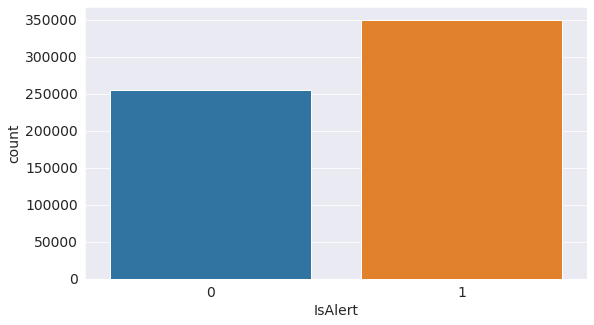

In [ ]:
sns.countplot(fordtrain.IsAlert)

/usr/local/lib/python3.7/dist-packages/seaborn/_decorators.py:43: FutureWarning:

Pass the following variables as keyword args: x, y. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.



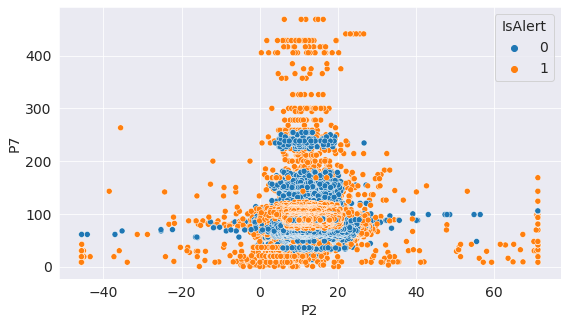

In [ ]:
sns.scatterplot(fordtrain.P2,fordtrain.P7,hue=fordtrain.IsAlert)

/usr/local/lib/python3.7/dist-packages/seaborn/_decorators.py:43: FutureWarning:

Pass the following variables as keyword args: x, y. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.



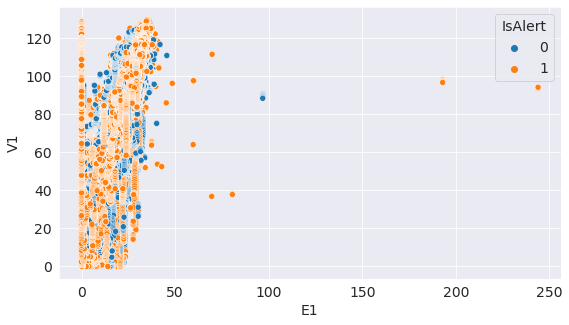

In [ ]:
sns.scatterplot(fordtrain.E1,fordtrain.V1,hue=fordtrain.IsAlert)

In [ ]:
fordtrain.ObsNum.count()

604329

In [ ]:
px.scatter(fordtrain,x='E1',y='V1',color='IsAlert')

/usr/local/lib/python3.7/dist-packages/seaborn/distributions.py:2619: FutureWarning:

`distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).



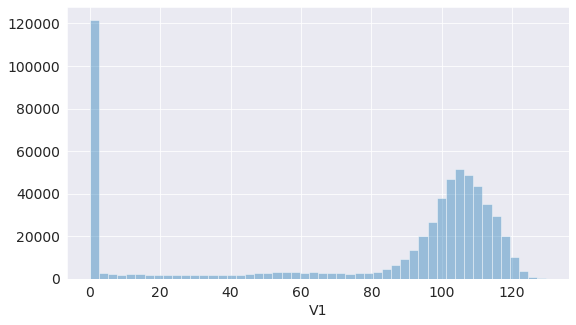

In [ ]:
sns.distplot(fordtrain.V1, kde=False);

/usr/local/lib/python3.7/dist-packages/seaborn/distributions.py:2619: FutureWarning:

`distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).



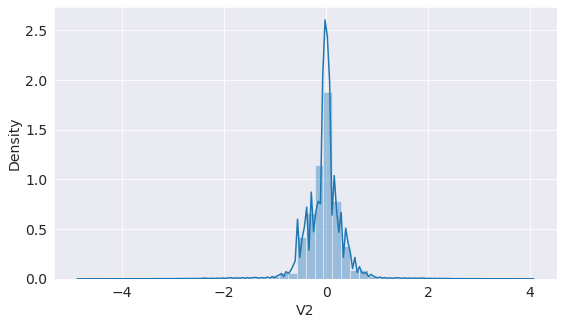

In [ ]:
sns.distplot(fordtrain.V2);

# Preparing the Data for Training

In [ ]:
fordtrain.columns

Index(['TrialID', 'ObsNum', 'IsAlert', 'P1', 'P2', 'P3', 'P4', 'P5', 'P6',
       'P7', 'P8', 'E1', 'E2', 'E3', 'E4', 'E5', 'E6', 'E7', 'E8', 'E9', 'E10',
       'E11', 'V1', 'V2', 'V3', 'V4', 'V5', 'V6', 'V7', 'V8', 'V9', 'V10',
       'V11'],
      dtype='object')

In [ ]:
input=['P1', 'P2', 'P3', 'P4', 'P5', 'P6',
       'P7', 'P8', 'E1', 'E2', 'E3', 'E4', 'E5', 'E6', 'E7', 'E8', 'E9', 'E10',
       'E11', 'V1', 'V2', 'V3', 'V4', 'V5', 'V6', 'V7', 'V8', 'V9', 'V10',
       'V11']
output='IsAlert'
cat_cols=['TrialID', 'ObsNum']

In [ ]:
x_train=fordtrain[input + cat_cols]
train_target=fordtrain[output]
x_test=fordtest[input +cat_cols]
test_target=fordtest[output]

In [ ]:
x_train

,P1,P2,P3,P4,P5,P6,P7,P8,E1,E2,E3,E4,E5,E6,E7,E8,E9,E10,E11,V1,V2,V3,V4,V5,V6,V7,V8,V9,V10,V11,TrialID,ObsNum
0,34.7406,9.84593,1400,42.8571,0.290601,572,104.8950,0,0.000,0.00,1,-20,0.015875,324,1,1,1,57,0.0,101.96,0.175,752,5.99375,0,2005,0,13.4,0,4,14.8004,0,0
1,34.4215,13.41120,1400,42.8571,0.290601,572,104.8950,0,0.000,0.00,1,-20,0.015875,324,1,1,1,57,0.0,101.98,0.455,752,5.99375,0,2007,0,13.4,0,4,14.7729,0,1
2,34.3447,15.18520,1400,42.8571,0.290601,576,104.1670,0,0.000,0.00,1,-20,0.015875,324,1,1,1,57,0.0,101.97,0.280,752,5.99375,0,2011,0,13.4,0,4,14.7736,0,2
3,34.3421,8.84696,1400,42.8571,0.290601,576,104.1670,0,0.000,0.00,1,-20,0.015875,324,1,1,1,57,0.0,101.99,0.070,752,5.99375,0,2015,0,13.4,0,4,14.7667,0,3
4,34.3322,14.69940,1400,42.8571,0.290601,576,104.1670,0,0.000,0.00,1,-20,0.015875,324,1,1,1,57,0.0,102.07,0.175,752,5.99375,0,2017,0,13.4,0,4,14.7757,0,4
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
604324,32.0051,10.13240,800,75.0000,0.081731,680,88.2353,0,17.807,222.11,0,0,0.016379,322,2,2,1,64,0.0,91.51,0.280,240,3.01875,0,1801,0,30.4,0,4,15.8113,510,1194
604325,32.0393,12.45040,800,75.0000,0.081731,680,88.2353,0,17.807,222.11,0,0,0.016379,322,2,2,1,64,0.0,91.51,0.280,240,3.01875,0,1801,0,30.4,0,4,15.8018,510,1195
604326,32.0762,10.06180,800,75.0000,0.081731,680,88.2353,0,17.807,222.11,0,0,0.016379,322,2,2,1,64,0.0,91.56,0.175,240,3.01875,0,1800,0,31.3,0,4,15.8120,510,1196
604327,32.1154,17.84500,800,75.0000,0.081731,680,88.2353,0,17.807,222.11,0,0,0.016379,322,2,2,1,64,0.0,91.56,0.175,240,3.01875,0,1800,0,31.3,0,4,15.8270,510,1197


# Imputing missing numeric values

In [ ]:
from sklearn.impute import SimpleImputer

In [ ]:
imputer=SimpleImputer(strategy='mean')

In [ ]:
imputer.fit(x_train[input])

SimpleImputer()

In [ ]:
x_train[input]=imputer.transform(x_train[input])

/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:1: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

/usr/local/lib/python3.7/dist-packages/pandas/core/indexing.py:1734: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy



In [ ]:
x_test[input]=imputer.transform(x_test[input])

/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:1: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

/usr/local/lib/python3.7/dist-packages/pandas/core/indexing.py:1734: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy



# Encoding Categorical Data

In [ ]:
from sklearn.preprocessing import OneHotEncoder

In [ ]:
encoder=OneHotEncoder(sparse=False, handle_unknown='ignore').fit(x_train[cat_cols])

In [ ]:
encoded_cols=list(encoder.get_feature_names(cat_cols))

/usr/local/lib/python3.7/dist-packages/sklearn/utils/deprecation.py:87: FutureWarning:

Function get_feature_names is deprecated; get_feature_names is deprecated in 1.0 and will be removed in 1.2. Please use get_feature_names_out instead.



In [ ]:
len(encoded_cols)

1711

In [ ]:
#x_train[encoded_cols]=encoder.transform(x_train[cat_cols])
#x_test[encoded_cols]=encoder.transform(x_test[cat_cols])

In [ ]:
jovian.commit()

[jovian] Detected Colab notebook...
[jovian] Uploading colab notebook to Jovian...
Committed successfully! https://jovian.ai/btech60309-19/driver-alertness-detection


'https://jovian.ai/btech60309-19/driver-alertness-detection'

# Scaling Numeric Features

In [ ]:
from sklearn.preprocessing import MinMaxScaler

In [ ]:
scaler=MinMaxScaler().fit(x_train[input])

In [ ]:
x_train[input].describe().loc[['min', 'max']]

,P1,P2,P3,P4,P5,P6,P7,P8,E1,E2,E3,E4,E5,E6,E7,E8,E9,E10,E11,V1,V2,V3,V4,V5,V6,V7,V8,V9,V10,V11
min,-22.4812,-45.6292,504.0,23.8853,0.03892,128.0,0.262224,0.0,0.000,0.000,0.0,-250.0,0.008000,260.0,0.0,0.0,0.0,0.0,0.0,0.0,-4.795,240.0,0.000,0.0,0.0,0.0,0.0,0.0,1.0,1.67673
max,101.3510,71.1737,2512.0,119.0480,27.20220,228812.0,468.750000,0.0,243.991,359.995,4.0,260.0,0.023939,513.0,25.0,9.0,1.0,127.0,52.4,129.7,3.990,1023.0,484.488,1.0,4892.0,0.0,82.1,0.0,7.0,262.53400


In [ ]:
x_train[input]=scaler.transform(x_train[input])

/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:1: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

/usr/local/lib/python3.7/dist-packages/pandas/core/indexing.py:1734: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy



In [ ]:
x_test[input]=scaler.transform(x_test[input])

/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:1: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

/usr/local/lib/python3.7/dist-packages/pandas/core/indexing.py:1734: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy



In [ ]:
x_train=x_train[input ]

In [ ]:
x_test=x_test[input]

In [ ]:
jovian.commit()

[jovian] Detected Colab notebook...
[jovian] Uploading colab notebook to Jovian...
Committed successfully! https://jovian.ai/btech60309-19/driver-alertness-detection


'https://jovian.ai/btech60309-19/driver-alertness-detection'

# Training, Validation and Test Sets

In [ ]:
from sklearn.model_selection import train_test_split

In [ ]:
train_df,val_df,train_target,val_target = train_test_split(x_train,train_target, test_size=0.2, random_state=42)

In [ ]:
jovian.commit()

[jovian] Detected Colab notebook...
[jovian] Uploading colab notebook to Jovian...
Committed successfully! https://jovian.ai/btech60309-19/driver-alertness-detection


'https://jovian.ai/btech60309-19/driver-alertness-detection'

In [ ]:
jovian.commit()

[jovian] Detected Colab notebook...
[jovian] Uploading colab notebook to Jovian...
Committed successfully! https://jovian.ai/btech60309-19/driver-alertness-detection


'https://jovian.ai/btech60309-19/driver-alertness-detection'

# Training LogisticRegression

In [ ]:
from sklearn.linear_model import LogisticRegression

In [ ]:
model = LogisticRegression(solver='liblinear')

In [ ]:
model.fit(train_df,train_target)

LogisticRegression(solver='liblinear')

In [ ]:
print(model.coef_.tolist())

[[-1.7891672811875508, -0.35266232993615465, -0.3779486650421321, -0.2830247685033119, 5.655148515900745, 7.496776978845858, 5.048188327673843, 0.0, 1.2481520947286018, -0.3074197610756305, 0.5415739996669995, -0.018389553942291186, -1.3471881880639474, -3.788474107176254, -1.0645956444350084, -1.971924966940731, 3.180573415589189, 1.0265922966193521, -0.12430131580524675, -1.8971786500756127, -0.6059740609088667, -0.31748754660722406, -0.21274063895391376, -0.08765310993027522, 1.8517687137092007, 0.0, -0.5361062696905858, 0.0, -0.7576070322022002, 48.542501605569626]]


In [ ]:
print(model.intercept_)

[-0.54542233]


In [ ]:
train_preds = model.predict(train_df)

In [ ]:
train_probs = model.predict_proba(train_df)
train_probs

array([[0.09298905, 0.90701095],
       [0.46530983, 0.53469017],
       [0.28690164, 0.71309836],
       ...,
       [0.54165955, 0.45834045],
       [0.49910443, 0.50089557],
       [0.03751907, 0.96248093]])

In [ ]:
from sklearn.metrics import accuracy_score,confusion_matrix

In [ ]:
accuracy_score(train_target, train_preds)

0.7915083470710271

In [ ]:
accuracy_score(val_target, model.predict(val_df))

0.790395975708636

In [ ]:
confusion_matrix(train_preds, train_target, normalize='true')

array([[0.78012866, 0.21987134],
       [0.2015345 , 0.7984655 ]])

In [ ]:
model.feature_names_in_

array(['P1', 'P2', 'P3', 'P4', 'P5', 'P6', 'P7', 'P8', 'E1', 'E2', 'E3',
       'E4', 'E5', 'E6', 'E7', 'E8', 'E9', 'E10', 'E11', 'V1', 'V2', 'V3',
       'V4', 'V5', 'V6', 'V7', 'V8', 'V9', 'V10', 'V11'], dtype=object)

From Logistic Regression I got Accuracy of 79% on validation data set

# DecisionTree

In [ ]:
from sklearn.tree import DecisionTreeClassifier

In [ ]:
tree=DecisionTreeClassifier(random_state=42)

In [ ]:
tree.fit(train_df, train_target)

DecisionTreeClassifier(random_state=42)

In [ ]:
train_preds1 = tree.predict(train_df)

In [ ]:
accuracy_score(train_target,train_preds1)

1.0

In [ ]:
accuracy_score(val_target, tree.predict(val_df))

0.9877302136250062

In [ ]:
tree.max_features_

30

In [ ]:
tree.feature_importances_

array([0.0365226 , 0.00157197, 0.00528065, 0.00568358, 0.05182447,
       0.04953578, 0.03613309, 0.        , 0.01099683, 0.02597018,
       0.00039367, 0.01646381, 0.02989241, 0.03724177, 0.02379401,
       0.0389831 , 0.14488117, 0.05841389, 0.00260946, 0.09449234,
       0.01003286, 0.00214564, 0.01381794, 0.00495119, 0.02817809,
       0.        , 0.01017418, 0.        , 0.00145306, 0.25856226])

In [ ]:
importance_df = pd.DataFrame({
    'feature':train_df.columns,
    'importance': tree.feature_importances_
}).sort_values('importance', ascending=False)

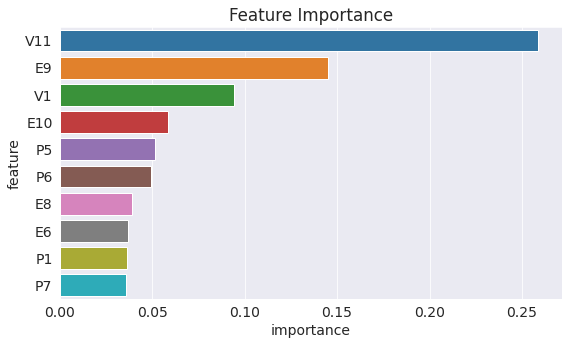

In [ ]:
import seaborn as sns
import matplotlib.pyplot as plt
plt.title('Feature Importance')
sns.barplot(data=importance_df.head(10), x='importance', y='feature');

In [ ]:
def max_depth_error(md):
    model = DecisionTreeClassifier(max_depth=md, random_state=42)
    model.fit(train_df, train_target)
    train_acc = 1 - model.score(train_df, train_target)
    val_acc = 1 - model.score(val_df, val_target)
    return {'Max Depth': md, 'Training Error': train_acc, 'Validation Error': val_acc}

In [ ]:
%%time
errors_df = pd.DataFrame([max_depth_error(md) for md in range(1, 21)])

CPU times: user 2min 28s, sys: 260 µs, total: 2min 28s
Wall time: 2min 27s


In [ ]:
errors_df

,Max Depth,Training Error,Validation Error
0,1,0.316949,0.318038
1,2,0.237507,0.236791
2,3,0.203848,0.203680
3,4,0.187603,0.189416
4,5,0.149587,0.150464
5,6,0.134500,0.135034
6,7,0.119167,0.119893
7,8,0.107408,0.108591
8,9,0.094160,0.095263
9,10,0.081456,0.082778


In [ ]:
tree=DecisionTreeClassifier(random_state=42,max_depth=30)

In [ ]:
tree.fit(train_df, train_target)

DecisionTreeClassifier(max_depth=30, random_state=42)

In [ ]:
tree.score(train_df, train_target)

0.9957659634760054

In [ ]:
tree.score(val_df, val_target)

0.9846524249995863

From DecisionTree I got Accuracy of 98% on validation data set

# RandomForestClassifier

In [ ]:
from sklearn.ensemble import RandomForestClassifier

In [ ]:
model=RandomForestClassifier(n_jobs=-1, random_state=42)
model.fit(train_df, train_target)

RandomForestClassifier(n_jobs=-1, random_state=42)

In [ ]:
model.score(train_df, train_target)

1.0

In [ ]:
model.score(val_df, val_target)

0.9944483973987722

In [ ]:
importance_df = pd.DataFrame({
    'feature': train_df.columns,
    'importance': model.feature_importances_
}).sort_values('importance', ascending=False)

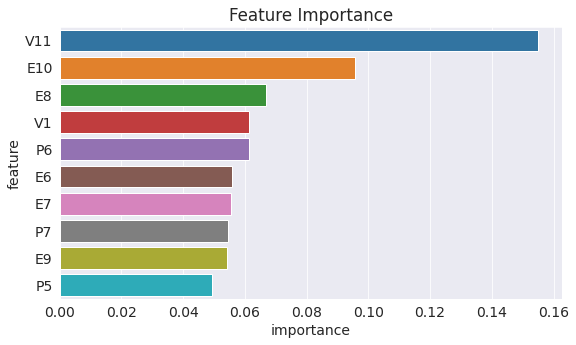

In [ ]:
plt.title('Feature Importance')
sns.barplot(data=importance_df.head(10), x='importance', y='feature');

In [ ]:
val_probs = model.predict_proba(val_df)
val_probs

array([[1.  , 0.  ],
       [0.  , 1.  ],
       [0.01, 0.99],
       ...,
       [0.98, 0.02],
       [0.  , 1.  ],
       [0.  , 1.  ]])

In [ ]:
def test_params(**params):
    model = RandomForestClassifier(random_state=42, n_jobs=-1, **params).fit(train_df, train_target)
    return model.score(train_df, train_target), model.score(val_df, val_target)

In [ ]:
test_params(max_depth=26)

(0.9962106717577146, 0.9873827213608459)

In [ ]:
test_params(max_leaf_nodes=2**20)

(1.0, 0.9946717852828753)

In [ ]:
test_params(max_features='log2')

(1.0, 0.9940595370079262)

In [ ]:
test_params(min_samples_split=100, min_samples_leaf=60)

(0.952846443264531, 0.9500024820876012)

In [ ]:
test_params(bootstrap=False)

(1.0, 0.9967319179918257)

In [ ]:
test_params(class_weight='balanced')

(1.0, 0.9946055962801781)

In [ ]:
test_params(n_estimators=200)

(1.0, 0.9947048797842238)

In [ ]:
jovian.commit()

[jovian] Detected Colab notebook...
[jovian] Uploading colab notebook to Jovian...
Committed successfully! https://jovian.ai/btech60309-19/driver-alertness-detection


'https://jovian.ai/btech60309-19/driver-alertness-detection'

From RandomForestClassifier I got Accuracy of 99% on validation data set

# xgboost

In [ ]:
! pip install xgboost --upgrade --quiet
from xgboost import XGBClassifier

In [ ]:
model=XGBClassifier(random_state=42, n_jobs=-1, n_estimators=100,max_depth=10,learning_rate=0.3)

In [ ]:
model.fit(train_df, train_target)

/usr/local/lib/python3.7/dist-packages/xgboost/sklearn.py:1224: UserWarning:

The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].



[10:45:12] WARNING: ../src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


XGBClassifier(base_score=0.5, booster='gbtree', colsample_bylevel=1,
              colsample_bynode=1, colsample_bytree=1, enable_categorical=False,
              gamma=0, gpu_id=-1, importance_type=None,
              interaction_constraints='', learning_rate=0.3, max_delta_step=0,
              max_depth=10, min_child_weight=1, missing=nan,
              monotone_constraints='()', n_estimators=100, n_jobs=-1,
              num_parallel_tree=1, predictor='auto', random_state=42,
              reg_alpha=0, reg_lambda=1, scale_pos_weight=1, subsample=1,
              tree_method='exact', validate_parameters=1, verbosity=None)

In [ ]:
model.score(train_df, train_target)

0.9923634280182765

In [ ]:
model.score(val_df,val_target)

0.9842966591100889

In [ ]:
importance_df = pd.DataFrame({
    'feature': train_df.columns,
    'importance': model.feature_importances_
}).sort_values('importance', ascending=False)

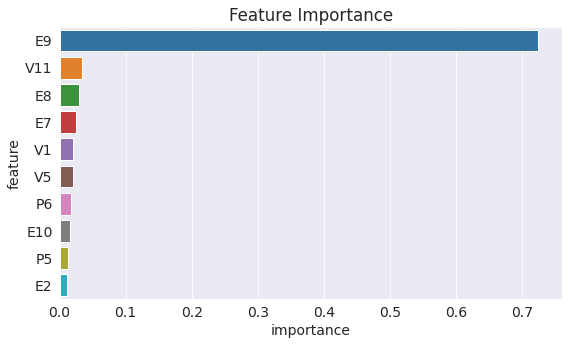

In [ ]:
plt.title('Feature Importance')
sns.barplot(data=importance_df.head(10), x='importance', y='feature');

In [ ]:
model=XGBClassifier(random_state=42, n_jobs=-1, n_estimators=100,max_depth=10,learning_rate=0.3)
model.fit(train_df, train_target)
model.score(train_df, train_target),model.score(val_df,val_target)

/usr/local/lib/python3.7/dist-packages/xgboost/sklearn.py:1224: UserWarning:

The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].



[10:51:21] WARNING: ../src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


(0.9923634280182765, 0.9842966591100889)

In [ ]:
model=XGBClassifier(random_state=42, n_jobs=-1, n_estimators=200,max_depth=20,learning_rate=0.03)
model.fit(train_df, train_target)
model.score(train_df, train_target),model.score(val_df,val_target)

/usr/local/lib/python3.7/dist-packages/xgboost/sklearn.py:1224: UserWarning:

The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].



[10:55:25] WARNING: ../src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


(0.9969801205056023, 0.9892194661856932)

In [ ]:
model=XGBClassifier(random_state=42, n_jobs=-1, n_estimators=300,max_depth=30,learning_rate=0.003)
model.fit(train_df, train_target)
model.score(train_df, train_target),model.score(val_df,val_target)

/usr/local/lib/python3.7/dist-packages/xgboost/sklearn.py:1224: UserWarning:

The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].



[11:11:40] WARNING: ../src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


(0.9931059874282003, 0.9826915757946817)

In [ ]:
model.feature_importances_

array([3.4913863e-04, 3.0822146e-05, 1.7161058e-04, 0.0000000e+00,
       1.0994467e-03, 1.2808032e-03, 0.0000000e+00, 0.0000000e+00,
       3.8135349e-04, 1.0570502e-03, 2.4838606e-04, 2.0420022e-04,
       4.2206497e-04, 5.4727099e-04, 2.4867286e-03, 4.2317216e-03,
       9.7612596e-01, 1.3276930e-03, 3.1447748e-04, 1.4270708e-03,
       4.0409621e-04, 1.4568334e-04, 6.2006008e-04, 2.4397476e-03,
       5.7599269e-04, 0.0000000e+00, 2.0909356e-04, 0.0000000e+00,
       6.5506744e-04, 3.2446852e-03], dtype=float32)

From XGBOOST I got Accuracy of 98% on validation data set

# Finally I Selected RandomForest

In [ ]:
model=RandomForestClassifier(n_jobs=-1, random_state=42,bootstrap=False)

In [ ]:
target=fordtrain['IsAlert']
model.fit(x_train,target)

RandomForestClassifier(bootstrap=False, n_jobs=-1, random_state=42)

In [ ]:
model.score(x_train,target)

1.0

In [ ]:
preds=model.predict(x_test)

In [ ]:
submission

,TrialID,ObsNum,Prediction
0,0,0,0
1,0,1,0
2,0,2,0
3,0,3,0
4,0,4,0
...,...,...,...
120835,99,1206,0
120836,99,1207,0
120837,99,1208,0
120838,99,1209,0


In [ ]:
submission['Prediction']=preds

In [ ]:
submission

,TrialID,ObsNum,Prediction
0,0,0,1
1,0,1,1
2,0,2,1
3,0,3,1
4,0,4,1
...,...,...,...
120835,99,1206,1
120836,99,1207,1
120837,99,1208,1
120838,99,1209,1


In [ ]:
jovian.commit()

[jovian] Detected Colab notebook...
[jovian] Uploading colab notebook to Jovian...
Committed successfully! https://jovian.ai/btech60309-19/driver-alertness-detection


'https://jovian.ai/btech60309-19/driver-alertness-detection'

In [ ]:
accuracy_score(solution.Prediction,preds)

0.8239904005296259

In [ ]:
submission.to_csv('final_result.csv', index=None)

# At The End I Got  Accuracy Of 99% on Validation Data Set  and 83% on Test Data Set.

In [ ]:
import os
os.listdir('./')

['.config', 'stayalert', 'final_result.csv', 'sample_data']

In [ ]:
from IPython.display import FileLink

In [ ]:
# Doesn't work on Colab, use the file browser instead.
FileLink('final_result.csv')

/home/jovyan/final_result.csv

# Saving The Model

In [ ]:
import joblib

In [ ]:
stay_alert = {
    'model': model,
    'imputer': imputer,
    'scaler': scaler,
    'encoder': encoder,
    'input_cols': input,
    'target_col': output,
    'numeric_cols': input,
    'categorical_cols': cat_cols,
    'encoded_cols': encoded_cols
}

In [ ]:
joblib.dump(stay_alert, 'stay_alert.joblib')

In [ ]:
jovian.commit()

<IPython.core.display.Javascript object>

[jovian] Updating notebook "btech60309-19/driver-alertness-detection" on https://jovian.ai
[jovian] Committed successfully! https://jovian.ai/btech60309-19/driver-alertness-detection


'https://jovian.ai/btech60309-19/driver-alertness-detection'

# Summary and References

Finally I got Accuracy of 83% on Test set.

YOU can download the Dataset from Kaggle:

- https://www.kaggle.com/c/stayalert

In [ ]:
jovian.commit()

<IPython.core.display.Javascript object>